# **HW #5**
# Classification task

Used dataset: ["Wine Quality"](https://www.kaggle.com/datasets/uciml/red-wine-quality-cortez-et-al-2009)

**Objects count:** 6497

**Variables:** 13

1. `type`: {red, white} / *Categorical*
1. `fixed acidity`: (g/l)
1. `volatile acidity`: (g/l)
1. `citric acid`: (g/l)
1. `residual sugar`: (g/l)
1. `chlorides`: (g/l)
1. `free sulfur dioxide`: (mg/l)
1. `total sulfur dioxide`: (g/l)
1. `density`: (g/ml)
1. `pH`: [0; 14]
1. `sulphates`: (g/l)
1. `alcohol`: (%)
1. `quality`: [0; 10] / *Output var*

**Other characteristics:**

* Has empty values
* Heterogeneous variables
* Unbalanced classes

## 0. Task definision:

We are to divide wines from the set into 2 groups: high-quality (HQ) and low-quality (LQ). Division is to be done using the "K-Nearest Neighbors" method.

*Ones with* `quality` *bigger or equal to 6 are treated is HQ and others as LQ.*

Taking a look at the data and googling some facts about the wine production, we can note the following statements:

- The bigger the `volatile acidity`, the worse the `quality`
- `sulfur dioxide` is lower for `red` wines
- The higher the `fixed acidity`, the lower the `pH`
- The dependece between the `citric acid` and the `fixed acidity` os linear

Lets check the statements and found out how to use it in order to estimate wine quality.

#### Deps initialization

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import seaborn as sns
import sklearn

from utils import DowloadData
from config import PRELOADED_DATASET_PATH, DATASET_URL

# 1. Read data

In [2]:
datasetFile = ""
if len(PRELOADED_DATASET_PATH):
    datasetFile = PRELOADED_DATASET_PATH
else:
    datasetFile = DowloadData(DATASET_URL)

data = pd.read_csv(datasetFile,  sep=',')

Table size:

In [3]:
data.shape

(6497, 13)

Here the first lines are:

In [4]:
data.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


and the last ones:

In [5]:
data.tail()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5
6496,red,6.0,0.310,0.47,3.6,0.067,18.0,42.0,0.99549,3.39,0.66,11.0,6


`type` is a categorical variable. Lets modify it's type

In [6]:
data['type'].dtype

dtype('O')

In [7]:
data['type'] = data['type'].astype('category')
data['type'].dtype

CategoricalDtype(categories=['red', 'white'], ordered=False)

# 2. Visualization and characterization of data

Quantitive data characteristics:

In [8]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6487.000000,6489.000000,6494.000000,6495.000000,6495.000000,6497.000000,6497.000000,6497.000000,6488.000000,6493.000000,6497.000000,6497.000000
mean,7.216579,0.339691,0.318722,5.444326,0.056042,30.525319,115.744574,0.994697,3.218395,0.531215,10.491801,5.818378
std,1.296750,0.164649,0.145265,4.758125,0.035036,17.749400,56.521855,0.002999,0.160748,0.148814,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


Categorical data characteristics:

In [9]:
data['type'] = data['type'].astype('category')
data.describe(include=['category'])

,type
count,6497
unique,2
top,white
freq,4898


So, we have 4898 lines of `red` wines and 1599 of `white`

Lets build the scattering diagram for each variable pair

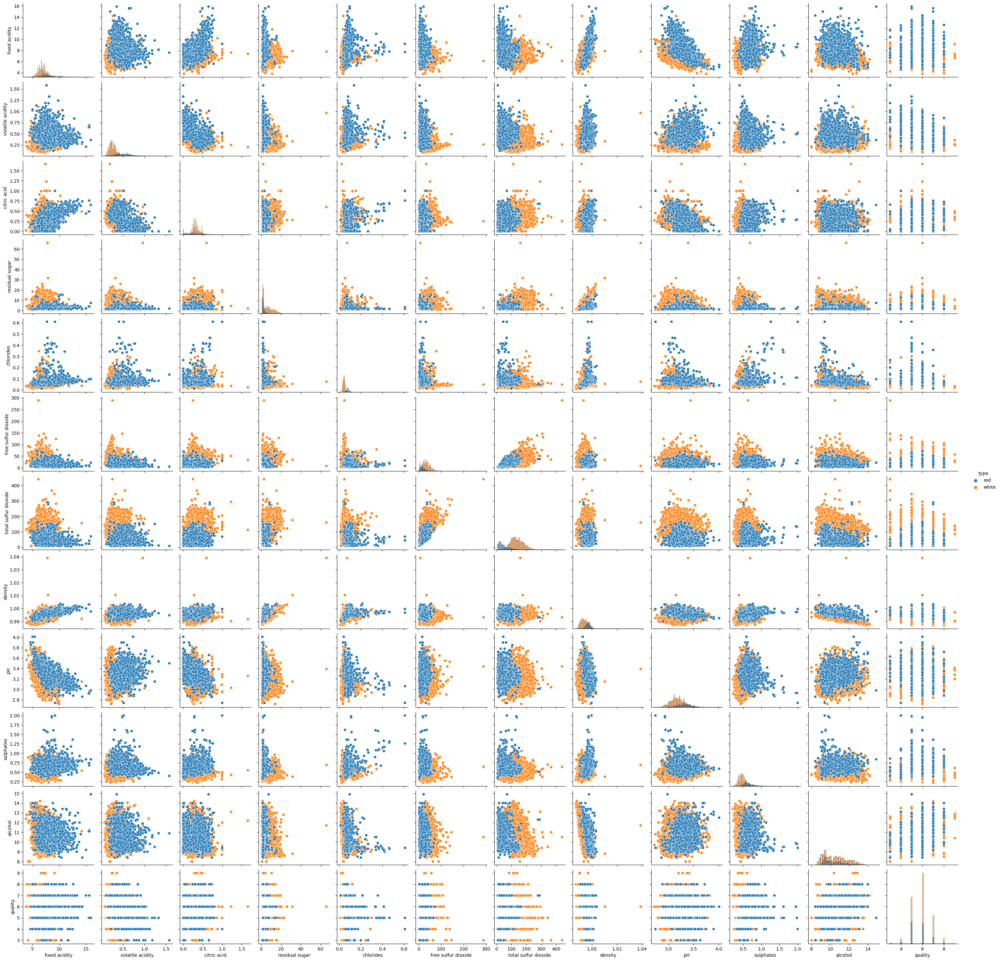

In [10]:
np.random.seed(42)
sns.pairplot(data, hue='type', diag_kind='hist')
pass

Drawing of all the points takes too much time. Also the data is hard to read. Lets select 1000 random points for draing

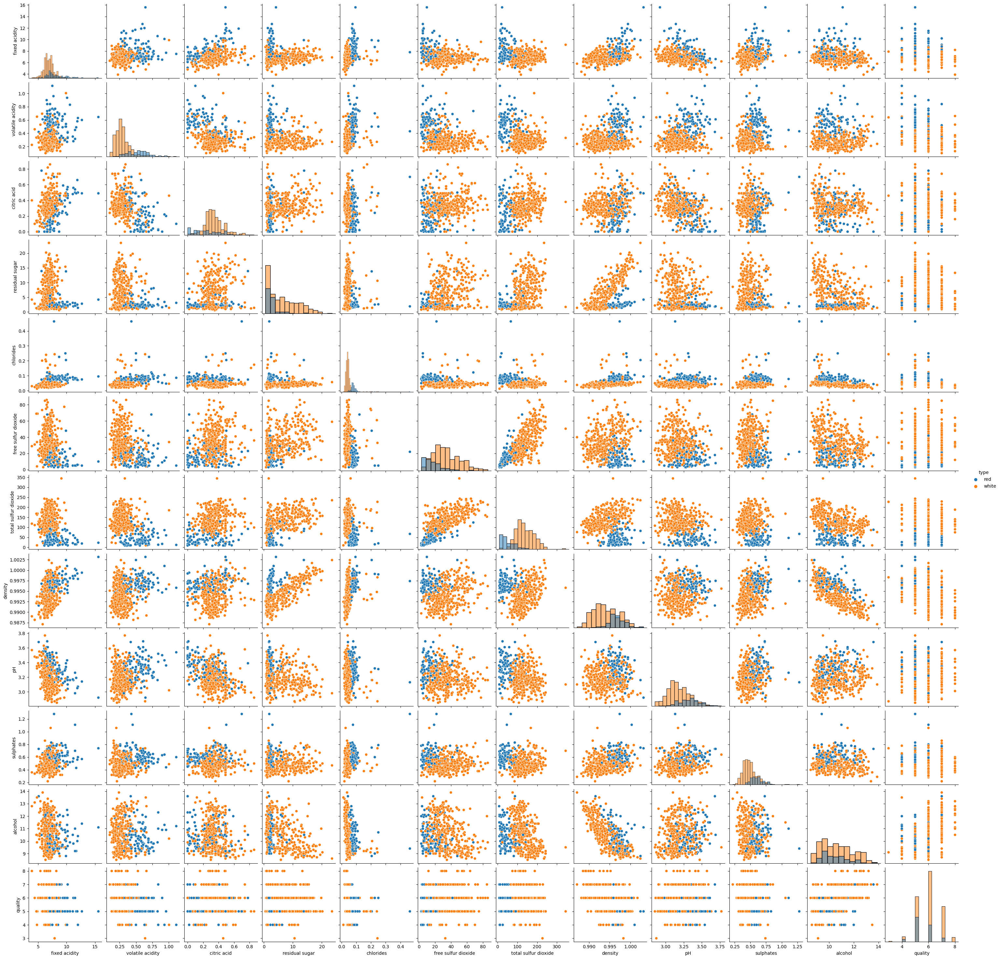

In [11]:
np.random.seed(42)
random_subset = np.random.choice(np.arange(data.shape[0]), size=500, replace=False)
sns.pairplot(data.iloc[random_subset], hue='type', diag_kind='hist')
pass

Lets check hypotheses noted above

1) The bigger the `volatile acidity`, the worse the `quality`

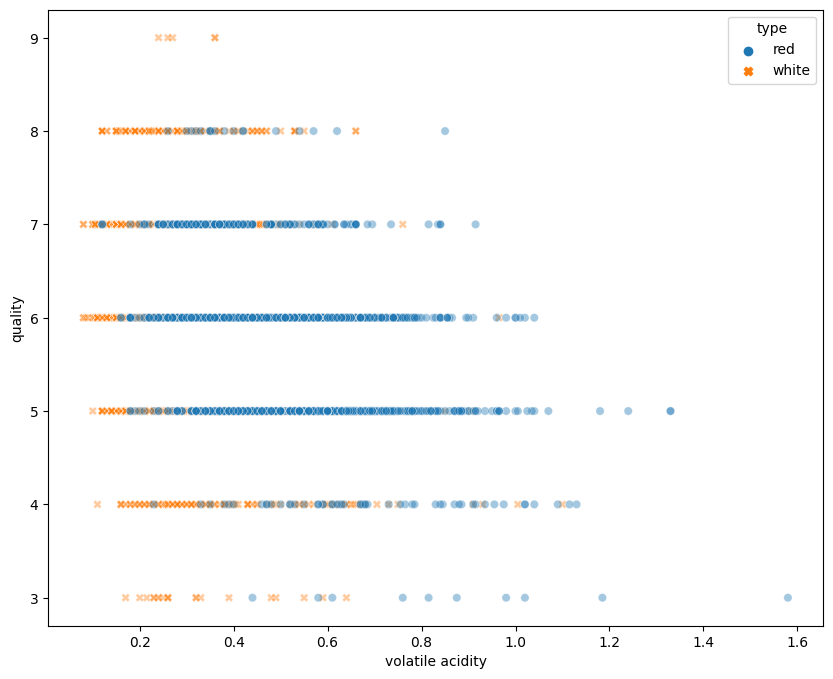

In [12]:
plt.figure(figsize = (10, 8))
sns.scatterplot(x='volatile acidity', y='quality', hue='type', style = 'type', data = data, alpha=0.4)
pass

As we can see, wines with `quality` above average have `volatile acidity` less them **1.0**, when LQ wines' `volatile acidity` could be even **1.5**.

We can also note that `red` wines' `volatile acidity` is lower than `white`'s

In [13]:
filter_good = data['quality'] >= 6
good_wine = data.loc[filter_good]
max_volatile_acidity = max(good_wine['volatile acidity'])
max_volatile_acidity

1.04

So, HQ wines' `volatile acidity` is 1.04 in maximum

In [14]:
filter_bad = data['quality'] < 6
bad_wine = data.loc[filter_bad]

C:\Users\ujinv\AppData\Local\Temp\ipykernel_22972\3589477648.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(good_wine['volatile acidity'], bins=20)
C:\Users\ujinv\AppData\Local\Temp\ipykernel_22972\3589477648.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(bad_wine['volatile acidity'], 

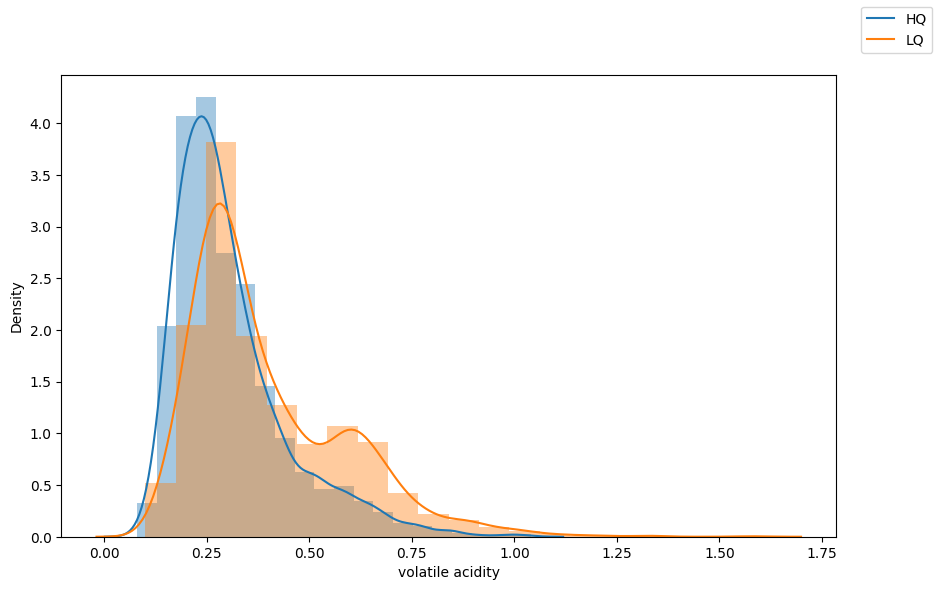

In [15]:
fig = plt.figure(figsize=(10,6))
sns.distplot(good_wine['volatile acidity'], bins=20)
sns.distplot(bad_wine['volatile acidity'], bins=20)
fig.legend(labels=['HQ','LQ'])
plt.show()

The most of all wines have low `volatile acidity` value. But count of wines with big `volatile acidity` value is bigger for LQ wines.

We can say, that `volatile acidity` can affect the `quality`, but not to much.

2) `sulfur dioxide` is lower for `red` wines

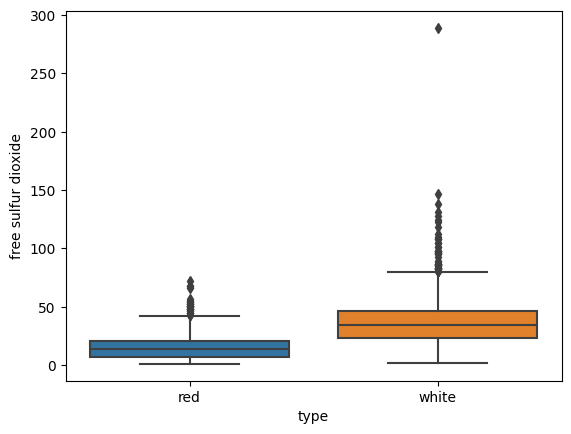

In [16]:
sns.boxplot(x="type", y="free sulfur dioxide", data=data)
pass

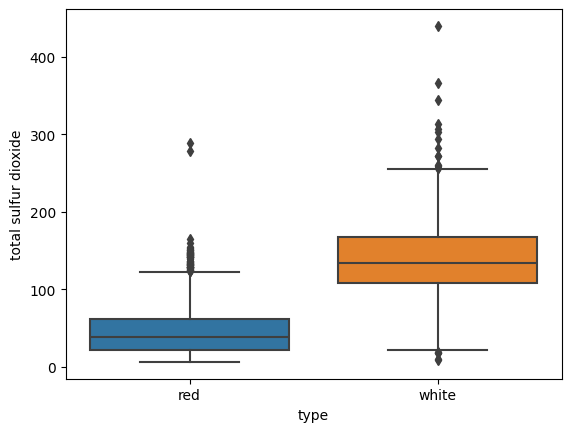

In [17]:
sns.boxplot(x="type", y="total sulfur dioxide", data=data)
pass

The statement have been approved for bot `total` and `free` `sulfur dioxide`s

3) `fixed acidity` and `pH` correlates with the rule: the higher the `fixed acidity`, the lower the `pH`

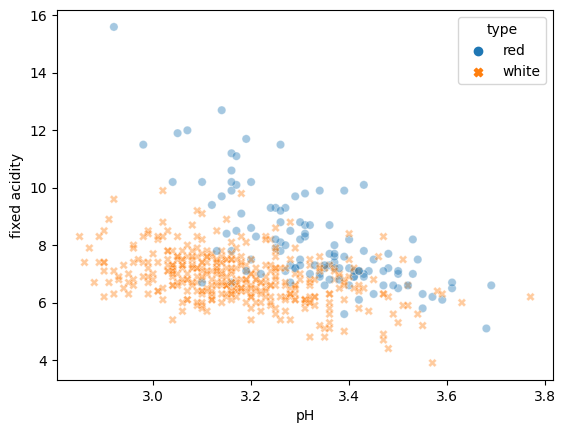

In [18]:
sns.scatterplot(x='pH', y='fixed acidity', hue='type', style = 'type', data = data.iloc[random_subset], alpha=0.4)
pass

4) The dependece between the `citric acid` and the `fixed acidity` os almost linear

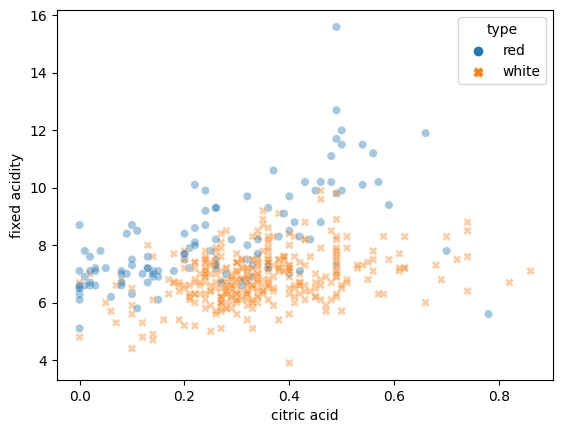

In [19]:
sns.scatterplot(x='citric acid', y='fixed acidity', hue='type', style = 'type', data = data.iloc[random_subset], alpha=0.4)
pass

**Corellation matrix**

In [20]:
corr_mat = data.corr(numeric_only=True)
corr_mat

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,0.220172,0.323736,-0.112319,0.298421,-0.283317,-0.329747,0.459204,-0.251814,0.300380,-0.095603,-0.077031
volatile acidity,0.220172,1.000000,-0.378061,-0.196702,0.377167,-0.353230,-0.414928,0.271193,0.260660,0.225476,-0.038248,-0.265953
citric acid,0.323736,-0.378061,1.000000,0.142486,0.039315,0.133437,0.195218,0.096320,-0.328689,0.057613,-0.010433,0.085706
residual sugar,-0.112319,-0.196702,0.142486,1.000000,-0.128902,0.403439,0.495820,0.552498,-0.267050,-0.185745,-0.359706,-0.036825
chlorides,0.298421,0.377167,0.039315,-0.128902,1.000000,-0.195042,-0.279580,0.362594,0.044806,0.395332,-0.256861,-0.200886
free sulfur dioxide,-0.283317,-0.353230,0.133437,0.403439,-0.195042,1.000000,0.720934,0.025717,-0.145191,-0.188489,-0.179838,0.055463
total sulfur dioxide,-0.329747,-0.414928,0.195218,0.495820,-0.279580,0.720934,1.000000,0.032395,-0.237687,-0.275381,-0.265740,-0.041385
density,0.459204,0.271193,0.096320,0.552498,0.362594,0.025717,0.032395,1.000000,0.011920,0.259454,-0.686745,-0.305858
pH,-0.251814,0.260660,-0.328689,-0.267050,0.044806,-0.145191,-0.237687,0.011920,1.000000,0.191248,0.121002,0.019366
sulphates,0.300380,0.225476,0.057613,-0.185745,0.395332,-0.188489,-0.275381,0.259454,0.191248,1.000000,-0.003261,0.038729


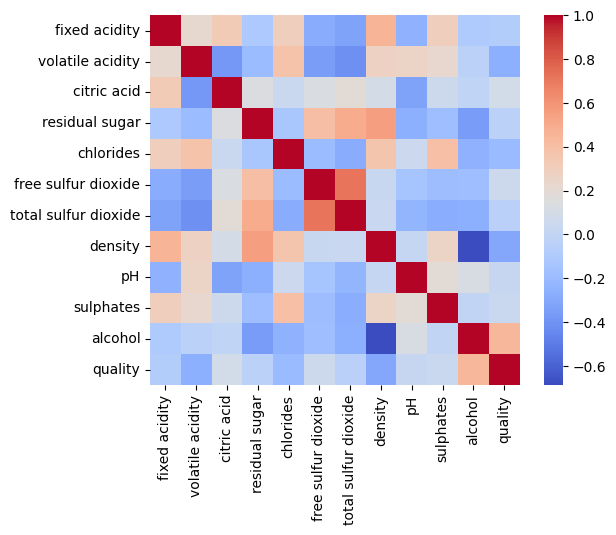

In [21]:
sns.heatmap(corr_mat, square=True, cmap='coolwarm')
pass

Выведем коэффициенты корреляции, большие заданного значения:

In [22]:
corr_mat > 0.5

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,True,False,False,False,False,False,False,False,False,False,False,False
volatile acidity,False,True,False,False,False,False,False,False,False,False,False,False
citric acid,False,False,True,False,False,False,False,False,False,False,False,False
residual sugar,False,False,False,True,False,False,False,True,False,False,False,False
chlorides,False,False,False,False,True,False,False,False,False,False,False,False
free sulfur dioxide,False,False,False,False,False,True,True,False,False,False,False,False
total sulfur dioxide,False,False,False,False,False,True,True,False,False,False,False,False
density,False,False,False,True,False,False,False,True,False,False,False,False
pH,False,False,False,False,False,False,False,False,True,False,False,False
sulphates,False,False,False,False,False,False,False,False,False,True,False,False


In [23]:
corr_mat.where(np.triu(corr_mat > 0.5, k=1)).stack().sort_values(ascending=False)

free sulfur dioxide  total sulfur dioxide    0.720934
residual sugar       density                 0.552498
dtype: float64

# 3. Missed values handling

Count of misses in every column:

In [24]:
data.isna().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

Misses could be replaced with medians

In [25]:
data.fillna(data.median(axis = 0, numeric_only=True), axis=0 , inplace=True)

In [26]:
data.isna().sum()

type                    0
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

# 4. Categorical characteristics processing

Replace `white` value of `type` with **0**, `red` with **1**
Replace `LQ` value of `quality` with **0**, `HQ` with **1**

In [27]:
data['type'] = pd.factorize(data['type'])[0]
data['quality'] = filter_good.astype(int)
data

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,1
1,0,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,1
2,0,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,1
3,0,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
4,0,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,1,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,0
6493,1,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.51,11.2,1
6494,1,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,1
6495,1,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,0


HQs count:

In [28]:
element_count_good = len([item for item in data['quality'] if item != 0])
element_count_bad = data.shape[0] - element_count_good
element_count_good

4113

LQs count:

In [29]:
element_count_bad

2384

LQs count: 2384

HQs count: 4113

**Emissions processing**

Default shape:

In [30]:
data.shape

(6497, 13)

Processed:

In [31]:
data_filter = data.copy()
for i in range(2, 12):
    rows_to_drop = data_filter[(data_filter[data_filter.columns[i]] < data_filter[data_filter.columns[i]].quantile(0.005)) | (data_filter[data_filter.columns[i]] > data_filter[data_filter.columns[i]].quantile(0.995))].index
    data_filter = data_filter.drop(rows_to_drop)
data_filter.shape

(6018, 13)

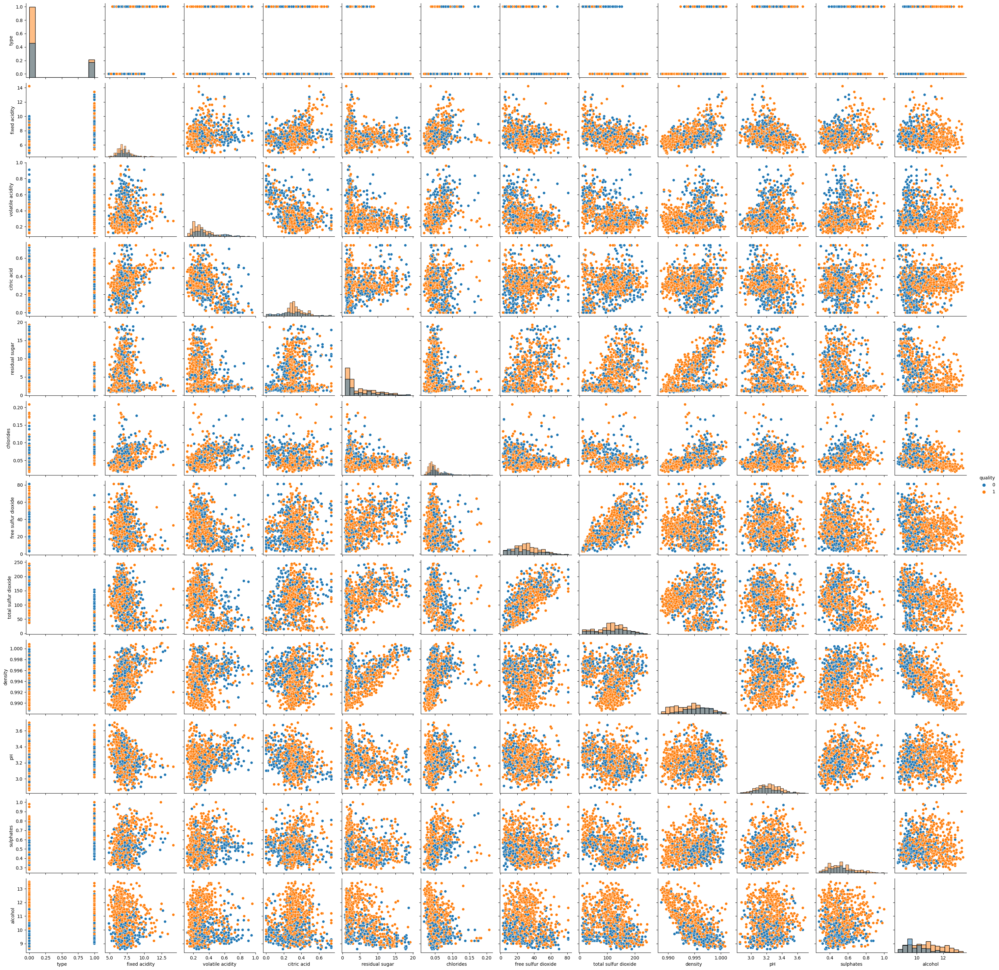

In [32]:
np.random.seed(42)
random_subset = np.random.choice(np.arange(data_filter.shape[0]), size=1000, replace=False)
sns.pairplot(data_filter.iloc[random_subset], hue='quality', diag_kind='hist')
pass

# 5. Values normalization

using standartization with **0** evarage vlue and **1** deviation

In [33]:
data_stand = (data_filter - data_filter.mean(axis = 0))/data_filter.std(axis = 0)
data_stand

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1,-0.558239,-0.735840,-0.227182,0.174470,-0.832082,-0.204217,-0.987752,0.291626,-0.233625,0.532108,-0.272384,-0.843412,0.758483
2,-0.558239,0.735473,-0.355629,0.609657,0.328022,-0.165035,-0.021338,-0.344986,0.154128,0.270183,-0.655125,-0.320586,0.758483
3,-0.558239,-0.000183,-0.676745,0.029408,0.678242,0.148419,1.005477,1.273827,0.330379,-0.188185,-0.961319,-0.494861,0.758483
4,-0.558239,-0.000183,-0.676745,0.029408,0.678242,0.148419,1.005477,1.273827,0.330379,-0.188185,-0.961319,-0.494861,0.758483
5,-0.558239,0.735473,-0.355629,0.609657,0.328022,-0.165035,-0.021338,-0.344986,0.154128,0.270183,-0.655125,-0.320586,0.758483
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,1.791050,-0.817580,1.699515,-1.711339,-0.744527,1.402237,0.099464,-1.308999,0.083627,1.514324,0.416551,0.027965,-1.318201
6493,1.791050,-1.062799,1.378398,-1.566277,-0.700749,0.305147,0.522270,-1.181676,0.161178,1.972692,-0.119287,0.637930,0.758483
6494,1.791050,-0.735840,1.121505,-1.348683,-0.678861,0.853692,-0.081739,-1.381755,0.379729,1.317881,1.717872,0.463654,0.758483
6495,1.791050,-1.062799,1.988519,-1.421214,-0.744527,0.814510,0.099464,-1.308999,0.284554,2.300098,1.411679,-0.233448,-1.318201


# 6. Train and test selections

For prediction all the variables will be used except `quality` itself

In [34]:
data_stand.columns

Index(['type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'],
      dtype='object')

In [35]:
x = data_stand.drop(['quality'], axis=1)
y = data_filter['quality']

**75%** of records will be used for train, **25%** for test

In [36]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state = 42)

N_train, _ = X_train.shape 
N_test,  _ = X_test.shape 

N_train, N_test

(4513, 1505)

# 7. Сlassifier usage

Nearest N neighbours algorythm is used

In [37]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=10)

In [38]:
y_test_predict = knn.predict(X_test)
err_test  = np.mean(y_test  != y_test_predict)

In [39]:
err_test

0.24518272425249169

In [40]:
knn.score(X_test, y_test)

0.7548172757475083

The best neighbours count selection:

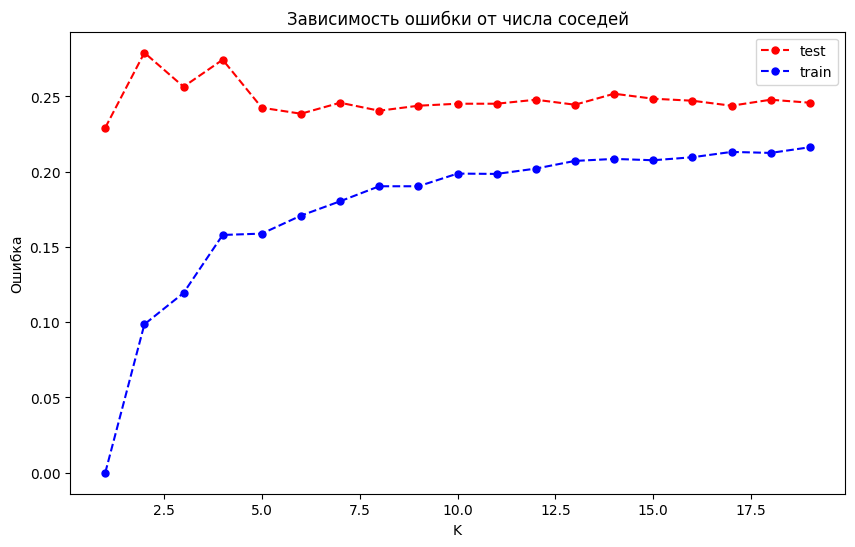

In [41]:
error_train = []
error_test = []
for i in range(1, 20):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    predict_i = knn.predict(X_test)
    predict_a_i = knn.predict(X_train)
    error_test.append(np.mean(y_test != predict_i))
    error_train.append(np.mean(y_train != predict_a_i))

plt.figure(figsize=(10,6))
plt.plot(range(1,20),error_test,color='red', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=5)
plt.plot(range(1,20),error_train,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=5)
plt.title('Зависимость ошибки от числа соседей')
plt.xlabel('K')
plt.ylabel('Ошибка')
plt.legend(labels=['test','train'])

In [42]:
for i in range(len(error_test)):
    print(i + 1, error_test[i], sep=":\t")

min_err = min(error_test)
max_err = max(error_test)

print()
print("min", min_err, error_test.index(min_err) + 1, sep=":\t")
print("max", max_err, error_test.index(max_err) + 1, sep=":\t")

1:	0.2292358803986711
2:	0.27906976744186046
3:	0.2564784053156146
4:	0.2744186046511628
5:	0.2425249169435216
6:	0.23853820598006645
7:	0.24584717607973422
8:	0.24053156146179402
9:	0.24385382059800664
10:	0.24518272425249169
11:	0.24518272425249169
12:	0.2478405315614618
13:	0.24451827242524918
14:	0.25182724252491695
15:	0.24850498338870433
16:	0.24717607973421926
17:	0.24385382059800664
18:	0.2478405315614618
19:	0.24584717607973422

min:	0.2292358803986711:	1
max:	0.27906976744186046:	2


In [66]:
error_test[0]

0.2292358803986711

Error ranges not too wide. The best result we got from **1** neighbour.

Check it with `GridSearchCV`

In [44]:
from sklearn.model_selection import GridSearchCV
nnb = list(range(1,20))
knn = KNeighborsClassifier()
grid = GridSearchCV(knn, param_grid = {'n_neighbors': nnb}, cv=10)
grid.fit(X_train, y_train)

best_cv_err = 1 - grid.best_score_
best_n_neighbors = grid.best_estimator_.n_neighbors
print(best_cv_err, best_n_neighbors)

0.22180356336950324 1


# **HW #8**
## Comparing different classifiers

## Multi-layer Perceptron classifier

In [46]:
from sklearn.neural_network import MLPClassifier
mlp_model = MLPClassifier(hidden_layer_sizes = (100,),
                          activation = 'logistic',
                          solver = 'lbfgs',
                          random_state = 42,
                          max_iter = 10000)
mlp_model.fit(X_train, y_train)
y_train_pred = mlp_model.predict(X_train)
y_test_pred = mlp_model.predict(X_test)

Train and test selections errors:

In [47]:
print(np.mean(y_train != y_train_pred), np.mean(y_test != y_test_pred), sep=",\t")

0.0,	0.24518272425249169


Find optimum alpha param

In [48]:
alpha_arr = np.logspace(-2, 2, 6)
mlp_models = []
test_err = []
train_err = []

for alpha in alpha_arr:
    mlp_models.append(MLPClassifier(alpha = alpha,
                                    hidden_layer_sizes = (100,),
                                    activation = 'logistic',
                                    solver = 'lbfgs',
                                    random_state = 42,
                                    max_iter= 10000))
    mlp_model = mlp_models[len(mlp_models) - 1]
    mlp_model.fit(X_train, y_train)

    y_train_pred = mlp_model.predict(X_train)
    y_test_pred = mlp_model.predict(X_test)

    train_err.append(np.mean(y_train != y_train_pred))
    test_err.append(np.mean(y_test != y_test_pred))

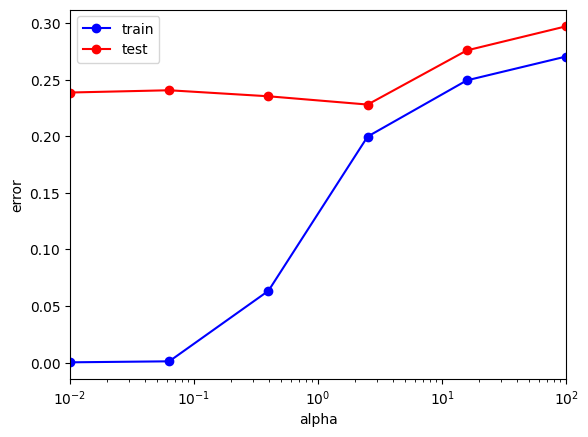

In [49]:
plt.semilogx(alpha_arr, train_err, 'b-o', label = 'train')
plt.semilogx(alpha_arr, test_err, 'r-o', label = 'test')
plt.xlim([np.min(alpha_arr), np.max(alpha_arr)])
plt.xlabel('alpha')
plt.ylabel('error')
plt.legend()

In [50]:
opt_idx = 3
alpha_opt = alpha_arr[opt_idx]
alpha_opt

2.5118864315095824

Train and test errors:

In [51]:
train_err[opt_idx], test_err[opt_idx]

(0.1996454686461334, 0.22790697674418606)

Классификатор при найденном оптимальном значении `alpha`:

In [52]:
mlp_model = mlp_models[opt_idx]
mlp_model.fit(X_train, y_train)

y_train_pred = mlp_model.predict(X_train)
y_test_pred = mlp_model.predict(X_test)

Матрица рассогласования:

In [53]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test_pred, y_test))

[[362 160]
 [183 800]]


Optimum neurons count on the 1st hidden layer

In [56]:
hidden_layer = np.arange(1, 50, 3)
mlp_models = []
test_err = []
train_err = []

for neuron in hidden_layer:
    mlp_models.append(MLPClassifier(alpha = alpha_opt, hidden_layer_sizes = (neuron,), solver = 'lbfgs', max_iter = 10000,
                                    activation = 'logistic', random_state = 42))

    mlp_model = mlp_models[len(mlp_models) - 1]
    mlp_model.fit(X_train, y_train)

    y_train_pred = mlp_model.predict(X_train)
    y_test_pred = mlp_model.predict(X_test)
    
    train_err.append(np.mean(y_train != y_train_pred))
    test_err.append(np.mean(y_test != y_test_pred))

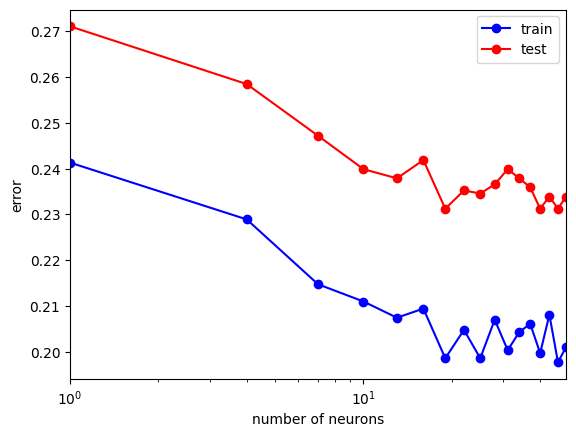

In [57]:
plt.semilogx(hidden_layer, train_err, 'b-o', label = 'train')
plt.semilogx(hidden_layer, test_err, 'r-o', label = 'test')
plt.xlim([np.min(hidden_layer), np.max(hidden_layer)])
plt.xlabel('number of neurons')
plt.ylabel('error')
plt.legend()

Optimum 1st layer neurons count

In [58]:
comp = list(np.array(train_err) - np.array(test_err))
opt_idx = comp.index(min(comp))
neuron_opt_1 = hidden_layer[opt_idx]
neuron_opt_1

31

Final train and test errors:

In [59]:
test_err[opt_idx], train_err[opt_idx]

(0.2398671096345515, 0.20031021493463327)

## Conclusion:

During the optimization, we decreased error a little bit. So, there is no Overfitting.

## RandomForest classifier

In [71]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=200)
rfc.fit(X_train, y_train)
y_train_pred = rfc.predict(X_train)
y_test_pred = rfc.predict(X_test)

Train and test selections errors:

In [72]:
print(np.mean(y_train != y_train_pred), np.mean(y_test != y_test_pred), sep=",\t")

0.0,	0.17940199335548174


## Logistic regression

In [73]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

Train and test selections errors:

In [74]:
print(np.mean(y_train != y_train_pred), np.mean(y_test != y_test_pred), sep=",\t")

0.24795036561045866,	0.2757475083056478


# Final conclusions

The best error result we got from RandomForest classifier. The worst from Logistic regression classifier.

Adjusting of multi-layer classifier made a small progress, but it is not enough good.